# Getting Started with `feems` - wolves data set

Running an analysis on data set in [Schweizer et al. 2016](https://onlinelibrary.wiley.com/doi/full/10.1111/mec.13364?casa_token=idW0quVPOU0AAAAA%3Ao_ll85b8rDbnW3GtgVeeBUB4oDepm9hQW3Y445HI84LC5itXsiH9dGO-QYGPMsuz0b_7eNkRp8Mf6tlW), similar to analyses in other notebooks...

In [343]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
from datetime import date
import pkg_resources
from sklearn.impute import SimpleImputer
from pandas_plink import read_plink
from copy import deepcopy
import itertools as it
import statsmodels.api as sm
from scipy.stats.distributions import chi2
import scipy as sp
from joblib import Parallel, delayed
from random import choices
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics.pairwise import haversine_distances

# viz
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import seaborn as sns
import plotly.express as px

# wolves_graph
import os
import sys
sys.path.append('../../')
from feems.utils import prepare_graph_inputs
from feems.spatial_graph import query_node_attributes
from feems import SpatialGraph, Viz, Objective
from feems.cross_validation import run_cv, comp_mats, run_cv_joint
from feems.helper_funcs import cov_to_dist, comp_genetic_vs_fitted_distance, plot_default_vs_long_range, get_best_lre
from feems.joint_ver import FEEMSmix_SpatialGraph, FEEMSmix_Objective

# change matplotlib fonts
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.sans-serif"] = "Arial"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Note we have packaged this example dataset in the `feems` package and use the `pkg_resources` package to find the path of those files:

In [344]:
data_path = pkg_resources.resource_filename("feems", "data/")

Next we read the `plink` formatted genotype data and impute any missing SNPs with the mean at each SNP:

In [345]:
# read the genotype data and mean impute missing data
(bim, fam, G) = read_plink("{}/wolvesadmix".format(data_path))
imp = SimpleImputer(missing_values=np.nan, strategy="mean")
genotypes = imp.fit_transform((np.array(G)).T)

print("n_samples={}, n_snps={}".format(genotypes.shape[0], genotypes.shape[1]))

Mapping files: 100%|██████████| 3/3 [00:00<00:00, 48.13it/s]

n_samples=111, n_snps=17729


In [346]:
# setup graph
coord = np.loadtxt("{}/wolvesadmix.coord".format(data_path))  # sample coordinates
outer = np.loadtxt("{}/wolvesadmix.outer".format(data_path))  # outer coordinates
grid_path = "{}/grid_50.shp".format(data_path)  # path to discrete global grid

# graph input files
outer, edges, grid, _ = prepare_graph_inputs(coord=coord, 
                                             ggrid=grid_path,
                                             translated=True, 
                                             buffer=1,
                                             outer=outer)

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


In [348]:
# wolves_graph = SpatialGraph(genotypes, coord, grid, edges)
wolves_graph = FEEMSmix_SpatialGraph(genotypes, coord, grid, edges)
wolves_graph.fit(lamb=2., optimize_q='n-dim', lamb_q=0)

constant-w/variance fit, converged in 132 iterations, train_loss=2795677.652
lambda=2.000, alpha=0.8354, converged in 473 iterations, train_loss=2751871.931


### Creating SpaceMix input data (using the allele frequency matrix + sample size)

In [ ]:
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/spacemix_freq.txt",wolves_graph.frequencies*np.sqrt(wolves_graph.mu*(1-wolves_graph.mu))/2)
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/spacemix_ss.txt",wolves_graph.n_samples_per_obs_node_permuted)
# longlat = []
# for i in range(wolves_graph.n_observed_nodes):
#     longlat.append(list(wolves_graph.nodes[permuted_idx[i]]['pos']))
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/spacemix_longlat.txt",np.array(longlat))

### Creating TreeMix input data (using the clustered allele counts)

In [ ]:
# import networkx as nx
# sample_idx = nx.get_node_attributes(wolves_graph, "sample_idx")
poporder
# treemixdf = pd.DataFrame(columns=permuted_idx[:wolves_graph.n_observed_nodes], index=range(wolves_graph.n_snps))
# for i, node_id in enumerate(permuted_idx[:wolves_graph.n_observed_nodes]):
#     s = sample_idx[node_id]

#     allele_counts = np.sum(wolves_graph.genotypes[s, :], axis=0)
#     treemixdf[node_id] = [str(int(ac)) + ',' + str(int(2*wolves_graph.n_samples_per_obs_node_permuted[i] - ac)) for ac in allele_counts]    

# treemixdf.to_csv("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/treemix_ac.csv", sep=' ', index=False)
# np.savetxt("/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/permidx.txt",permuted_idx[:wolves_graph.n_observed_nodes],fmt ='%.0f')

,id,col
0,35,#E6AB02
1,42,#E6AB02
2,71,#E6AB02
3,90,#E6AB02
4,102,#E6AB02
...,...,...
89,980,#D95F02
90,989,#7570B3
91,1078,#7570B3
92,1124,#D95F02


/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

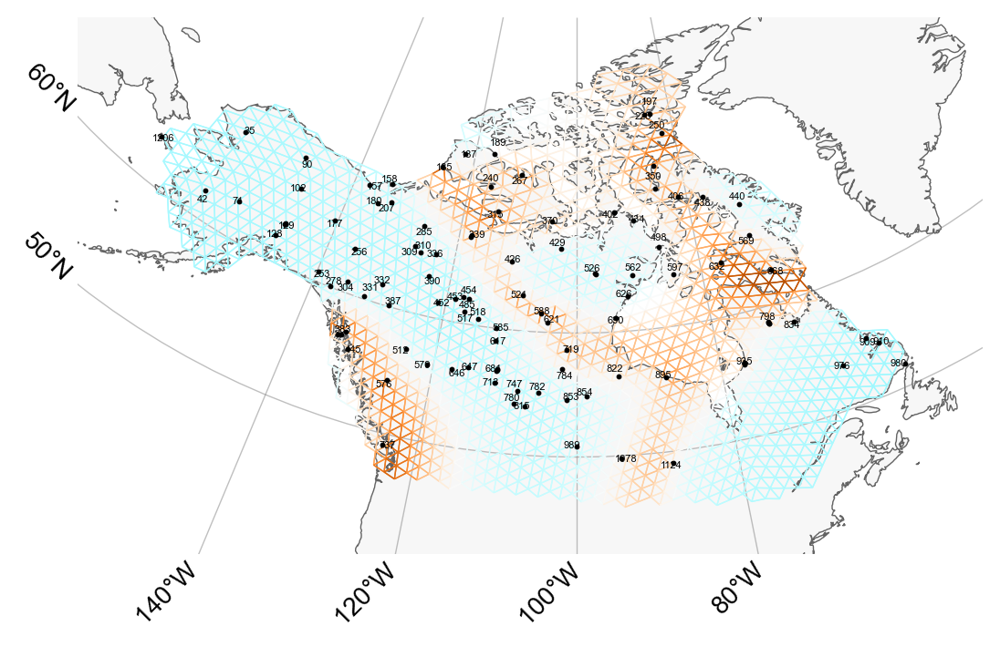

In [ ]:
projection = ccrs.EquidistantConic(central_longitude=-100, central_latitude=60)   
fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
        obs_node_size=7.5, sample_pt_color="black", obs_node_textsize=4,
        cbar_font_size=10)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_samples(); v.draw_edges(use_weights=True); 
# for i in range(wolves_graph.n_observed_nodes):
#         v.ax.plot(obs_grid[i,0], obs_grid[i,1], 'o', color=poporder['col'].iloc[i], markersize=4, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[i,0], central_latitude=obs_grid[i,1]))
v.draw_obs_nodes(use_ids=True); #v.draw_edge_colorbar()
# v.ax.plot(obs_grid[36, 0], obs_grid[36, 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[36, 0], central_latitude=obs_grid[36, 1]))
# for dest in np.unique(outliers_df['dest.']):
#     v.ax.plot(obs_grid[np.where(permuted_idx == dest)[0], 0], obs_grid[np.where(permuted_idx == dest)[0], 1], 'ro', markersize=20*np.log10(np.sum(outliers_df['dest.']==dest)+1), alpha=0.5)

In [396]:
# med_spacemix = [0.01937429,0.01587325,0.006617999,0.004845347,0.006708163,0.00401827,0.0122487,0.00482947,0.002456252,0.002708504,0.1000575,0.1273344,0.004317822,0.003019414,0.002672921,0.09961773,0.003418695,0.003509599,0.004024112,0.004007152,0.002642361,0.002530899,0.002384085,0.004048692,0.002563896,0.002027101,0.003977936,0.003677587,0.002896895,0.0024975,0.003149439,0.004312738,0.00227444,0.002233898,0.00183585,0.003061934,0.003979968,0.002955401,0.003338955,0.003397887,0.003521155,0.004141994,0.002927201,0.003589331,0.002817105,0.002839483,0.003985941,0.002373238,0.004032835,0.004593606,0.003228359,0.003257948,0.002662256,0.003007602,0.005200164,0.004152379,0.003113858,0.002885949,0.00408016,0.003088208,0.004521971,0.008347207,0.003670392,0.1787385,0.0041278,0.01117924,0.004548573,0.003416117,0.005115239,0.001657582,0.003911237,0.003545994,0.00273064,0.002594609,0.002706837,0.003127315,0.003432761,0.004177043,0.0009712552,0.003704936,0.006351901,0.002827244,0.003718221,0.005222881,0.007940766,0.004053953,0.003225135,0.001104474,0.002350154,0.07508196,0.004172863,0.002832125,0.001829685,0.1905081]
# low_spacemix = [0.000897215,0.000883515,0.0003152308,0.0001783414,0.0001263806,0.0002117441,0.0005691187,0.0001017287,0.0001441438,0.0001115783,0.01455387,0.009495504,0.0001391555,0.0002546154,0.0001033251,0.01418984,0.00009573956,0.0001252788,0.0001894526,0.0001786773,0.00002211429,0.000128457,0.0003422592,0.00008624158,0.0002547229,0.00004294275,0.0002931522,0.0000114855,0.0001440366,0.0001177462,0.00003943307,0.00004251546,0.0001998847,0.0001160401,0.00008392832,0.0001051864,0.0001626113,0.00009667649,0.0001383472,0.0001124294,0.0001933383,0.0001970422,0.00007637774,0.0001894598,0.0001693688,0.0001144978,0.000143404,0.0001543102,0.0002778853,0.00009854014,0.0001856883,0.0001230146,0.00003003104,0.0002553205,0.0004264873,0.0001960061,0.00001612395,0.00002108883,0.0003152421,0.000115327,0.0001492339,0.0001476192,0.0002845236,0.1262221,0.00003898708,0.0005145195,0.0002264754,0.00002980656,0.0002916458,0.0001520485,0.00003570642,0.0002020343,0.0001778328,0.0002384659,0.0001526563,0.00000255398,0.00004213508,0.00006416699,0.00004324126,0.00001642329,0.0003001758,0.000053435,0.00006740519,0.0002366941,0.0003375228,0.00002340561,0.0001733865,0.00004652174,0.00007655947,0.01808362,0.0002585558,0.00003214257,0.0001024796,0.1322754]
# upp_spacemix = [0.06045592,0.05188655,0.02948005,0.01913859,0.02871016,0.01999014,0.04940507,0.0208047,0.0221807,0.0168951,0.1478331,0.2002445,0.03671032,0.01448133,0.01237573,0.1607841,0.01388515,0.02734635,0.02258282,0.01891659,0.01537074,0.01564139,0.009627474,0.01826564,0.01896702,0.01236076,0.01249714,0.02085416,0.01279819,0.01738598,0.02163806,0.0291359,0.009757326,0.01491553,0.01398314,0.01479675,0.01537421,0.01336835,0.01662656,0.02430628,0.02067816,0.021131,0.009807138,0.01912948,0.01652029,0.01698084,0.01606524,0.01587904,0.01332922,0.02609124,0.02049717,0.01600329,0.0153979,0.01870126,0.03292576,0.02144142,0.01532726,0.01603268,0.01431206,0.01558017,0.01982415,0.04019233,0.02308869,0.2217451,0.02262178,0.04293267,0.01811621,0.02045679,0.0264703,0.01258225,0.02452506,0.02202632,0.02442458,0.01137278,0.01640466,0.01783253,0.01470676,0.01861735,0.00508181,0.02384039,0.04139652,0.01457178,0.02139582,0.02858446,0.04494716,0.02277083,0.01732321,0.008245681,0.01162835,0.1250916,0.01875431,0.01677644,0.01087549,0.2379548]
# projection = ccrs.EquidistantConic(central_longitude=-100, central_latitude=60)   
# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
#         edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
#         obs_node_size=7.5, sample_pt_color="black", obs_node_textsize=4,
#         cbar_font_size=10)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); 
# # for i in range(wolves_graph.n_observed_nodes):
# #         v.ax.plot(obs_grid[i,0], obs_grid[i,1], 'o', color='dodgerblue', markersize=150*np.array(med_spacemix[i]), alpha=0.7, transform=ccrs.EquidistantConic(central_longitude=obs_grid[i,0], central_latitude=obs_grid[i,1]))
# v.draw_obs_nodes(use_ids=True)

In [400]:
contour_dict = {1206:contour_df1206,980:contour_df980,180:contour_df180,189:contour_df189,402:contour_df402,207:contour_df207,585:contour_df585,747:contour_df747,621:contour_df621,187:contour_df187,390:contour_df390,815:contour_df815}

In [415]:
admix_df = pd.DataFrame(columns=['med_spacemix','low_spacemix','upp_spacemix','FEEMS_mle','dest.','type'],index=range(94))
spacemix_demes = [35, 42, 129,  180,  185,  207,  621,  632,  980, 1206]
# contour_df1206['admix. prop.'].iloc[contour_df1206['scaled log-lik'].argmax()]
# np.unique(outliers_df['dest.'])
for i in range(wolves_graph.n_observed_nodes):
    admix_df['dest.'].iloc[i] = poporder['id'].iloc[i]
    admix_df['med_spacemix'].iloc[i] = med_spacemix[i]
    admix_df['low_spacemix'].iloc[i] = low_spacemix[i]
    admix_df['upp_spacemix'].iloc[i] = upp_spacemix[i]

    if admix_df['dest.'].iloc[i] in contour_dict.keys():
        admix_df['FEEMS_mle'].iloc[i] = contour_dict[admix_df['dest.'].iloc[i]]['admix. prop.'].iloc[contour_dict[admix_df['dest.'].iloc[i]]['scaled log-lik'].argmax()]
        if admix_df['dest.'].iloc[i] in spacemix_demes:
            admix_df['type'].iloc[i] = 'FEEMS & SpaceMix'
        else:
            admix_df['type'].iloc[i] = 'FEEMS not SpaceMix'
    else:
        if admix_df['dest.'].iloc[i] in spacemix_demes:
            admix_df['type'].iloc[i] = 'SpaceMix not FEEMS'
        else:
            admix_df['type'].iloc[i] = 'Neither'
        admix_df['FEEMS_mle'].iloc[i] = np.nan


In [436]:
admix_df.loc[admix_df['type']=='SpaceMix not FEEMS']

,med_spacemix,low_spacemix,upp_spacemix,FEEMS_mle,dest.,type
0,0.019374,0.000897,0.060456,NaN,35,SpaceMix not FEEMS
1,0.015873,0.000884,0.051887,NaN,42,SpaceMix not FEEMS
6,0.012249,0.000569,0.049405,NaN,129,SpaceMix not FEEMS
11,0.127334,0.009496,0.200244,NaN,185,SpaceMix not FEEMS
65,0.011179,0.000515,0.042933,NaN,632,SpaceMix not FEEMS


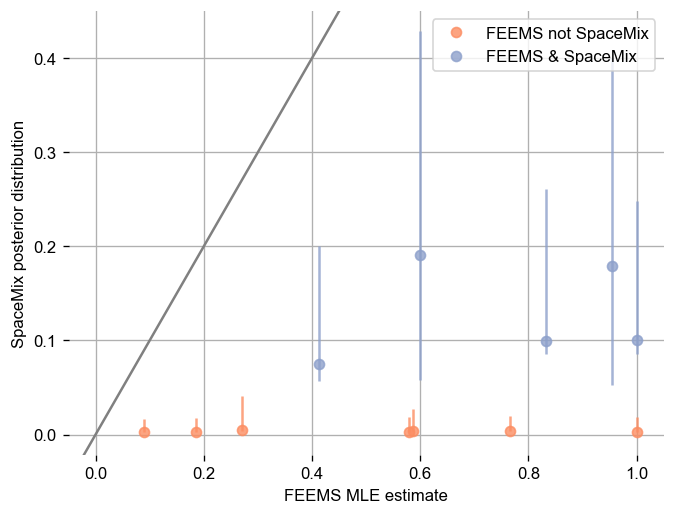

In [442]:
# admix_df.loc[admix_df['type']!='Neither']
plt.figure(dpi=120)
plt.plot(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS not SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'],'o',color='#fc8d62',alpha=0.8,label='FEEMS not SpaceMix'); plt.errorbar(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS not SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'],yerr=np.array((admix_df['low_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'].values,admix_df['upp_spacemix'].loc[admix_df['type']=='FEEMS not SpaceMix'].values)),fmt='none',color='#fc8d62',alpha=0.8)
plt.plot(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS & SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'],'o',color='#8da0cb',alpha=0.8,label='FEEMS & SpaceMix'); plt.errorbar(admix_df['FEEMS_mle'].loc[admix_df['type']=='FEEMS & SpaceMix'],admix_df['med_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'],yerr=np.array((admix_df['low_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'].values,admix_df['upp_spacemix'].loc[admix_df['type']=='FEEMS & SpaceMix'].values)),fmt='none',color='#8da0cb',alpha=0.8); plt.legend(); plt.grid(); plt.box(False); plt.axline((0,0),slope=1,color='grey')
plt.xlabel('FEEMS MLE estimate'); plt.ylabel('SpaceMix posterior distribution'); 

In [ ]:
# obj = FEEMSmix_Objective(wolves_graph); obj.inv(); obj.Lpinv = np.linalg.pinv(wolves_graph.L.todense()); obj.grad(reg=False)
# fit_cov, _, emp_cov = comp_mats(obj)
# fit_dist = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
# emp_dist = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
# X = sm.add_constant(fit_dist)
# mod = sm.OLS(emp_dist, X)
# res = mod.fit()
# muhat, betahat = res.params

# plt.plot(fit_dist,emp_dist,'ko',alpha=0.5,markersize=5);  plt.xlabel('fitted distance'); plt.ylabel('empirical distance'); plt.grid(); plt.box(False)
# x_ = np.linspace(np.min(fit_dist), np.max(fit_dist), 20)
# plt.plot(x_, muhat + betahat * x_, zorder=2, color="orange", linestyle='--', linewidth=3)
# plt.text(4.5, 1.5, "R²={:.3f}".format(res.rsquared), size='x-large'); plt.title('None fit'); plt.show()
# plt.hist(1/wolves_graph.q,bins=12,color='grey'); plt.xlabel(r'$\hat q$')

# plt.plot(fit_dist,emp_dist/fit_dist-np.mean(emp_dist/fit_dist),'ko'); plt.axhline(-3*np.std(emp_dist/fit_dist),color='red')

# lamb_grid = np.geomspace(1e-1,100,10,endpoint=True)[::-1]
## cvq_err = run_cv_joint(wolves_graph, lamb_grid=lamb_grid, lamb_q_grid=lamb_grid)
# cv10_err = run_cv_joint(wolves_graph, lamb_grid=lamb_grid, lamb_q_grid=lamb_grid, n_folds=10)
# plt.plot(lamb_grid,np.nanmean(cv10_err,axis=(0,1)),'k-o',label=r'$\lambda_w$'); plt.xlabel('values'); plt.ylabel('10-fold CV error'); plt.plot(lamb_grid,np.nanmean(cv10_err,axis=(0,2)),'-o',color='grey',label=r'$\lambda_q$'); plt.semilogx(); plt.legend(); plt.grid()
# plt.imshow(np.min(np.mean(cvq_err,axis=0))-np.mean(cvq_err,axis=0),cmap='Blues'); plt.colorbar(); plt.xlabel(r'$\lambda_q$'); plt.ylabel(r'$\lambda_w$'); 
# np.unravel_index(np.argmin(np.mean(cvq_err,axis=0)),(10,10))

# lle, te = get_best_lre(wolves_graph, genotypes, coord, grid, edges, k=5, top=20, nchoose=500, option='hard')

In [ ]:
# outliers_df = obj.extract_outliers(pthresh=0.001, verbose=False)
# [outliers_df['Fst'].loc[outliers_df['dest.']==i] for i in [621, 180, 187, 189, 585, 747, 390, 402, 815, 1206]]

,source,dest.,"source (lat., long.)","dest. (lat., long.)",pval,raw diff.,"# of samples (source, dest.)",Fst
0,185,189,"(67.399, -166.067)","(65.954, -168.75)",2.544091e-04,-0.315248,"(1, 1)",0.280134
1,187,207,"(59.978, -164.822)","(66.426, -166.162)",6.797387e-04,-0.445107,"(1, 1)",0.350612
2,339,207,"(64.374, -161.457)","(59.978, -164.822)",6.760818e-07,-0.472399,"(2, 1)",0.344398
3,250,402,"(70.12, -159.682)","(63.024, -164.106)",4.202259e-04,-0.391904,"(1, 1)",0.321507
4,434,207,"(60.399, -161.092)","(59.978, -164.822)",3.195033e-04,-0.469135,"(1, 1)",0.357014
...,...,...,...,...,...,...,...,...
66,713,980,"(67.309, -149.474)","(62.92, -155.731)",2.964589e-04,-0.512364,"(1, 1)",0.362372
67,815,980,"(67.309, -149.474)","(70.824, -149.716)",5.053378e-04,-0.481465,"(1, 1)",0.358114
68,1078,815,"(69.117, -148.035)","(70.824, -149.716)",3.598279e-07,-0.632801,"(1, 1)",0.330475
69,935,1206,"(56.569, -156.093)","(65.163, -151.729)",7.845743e-04,-0.429804,"(1, 5)",0.392322


### Running a PCA on the demes from FEEMS

In [252]:
[str(poporder.loc[w==poporder['id']]['id'].values[0]) for w in wolves_graph.assned_node_idx].index('1206')

102

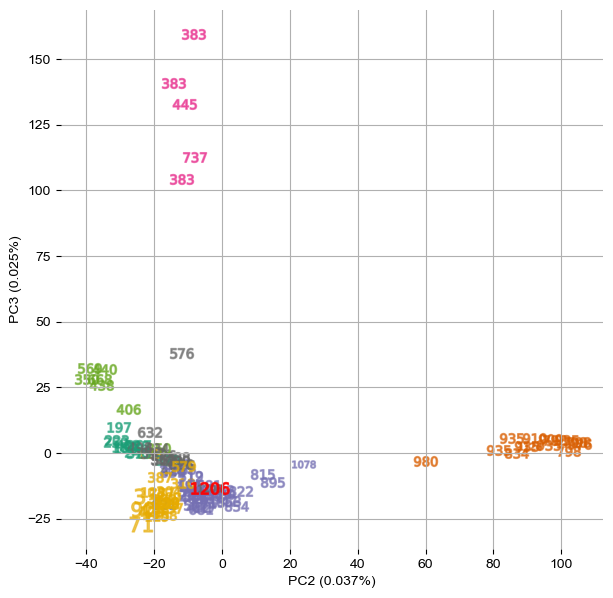

In [254]:
# import allel
# poporder = pd.read_csv('/Volumes/GoogleDrive/Other computers/My Mac mini/Documents/feemsResults/wolves/poporder.txt',sep=' ',header=None,names=['id','col'])

# gn = np.zeros((wolves_graph.n_snps,wolves_graph.n_observed_nodes))
# for i, node_id in enumerate(permuted_idx[:wolves_graph.n_observed_nodes]):
#     s = sample_idx[node_id]

#     allele_counts = np.sum(wolves_graph.genotypes[s, :], axis=0)
#     gn[:,i] = allele_counts

# pcacoord, mod = allel.pca(wolves_graph.genotypes.T, n_components=10)
# cols = [str(poporder.loc[w==poporder['id']]['col'].values[0]) for w in wolves_graph.assned_node_idx]

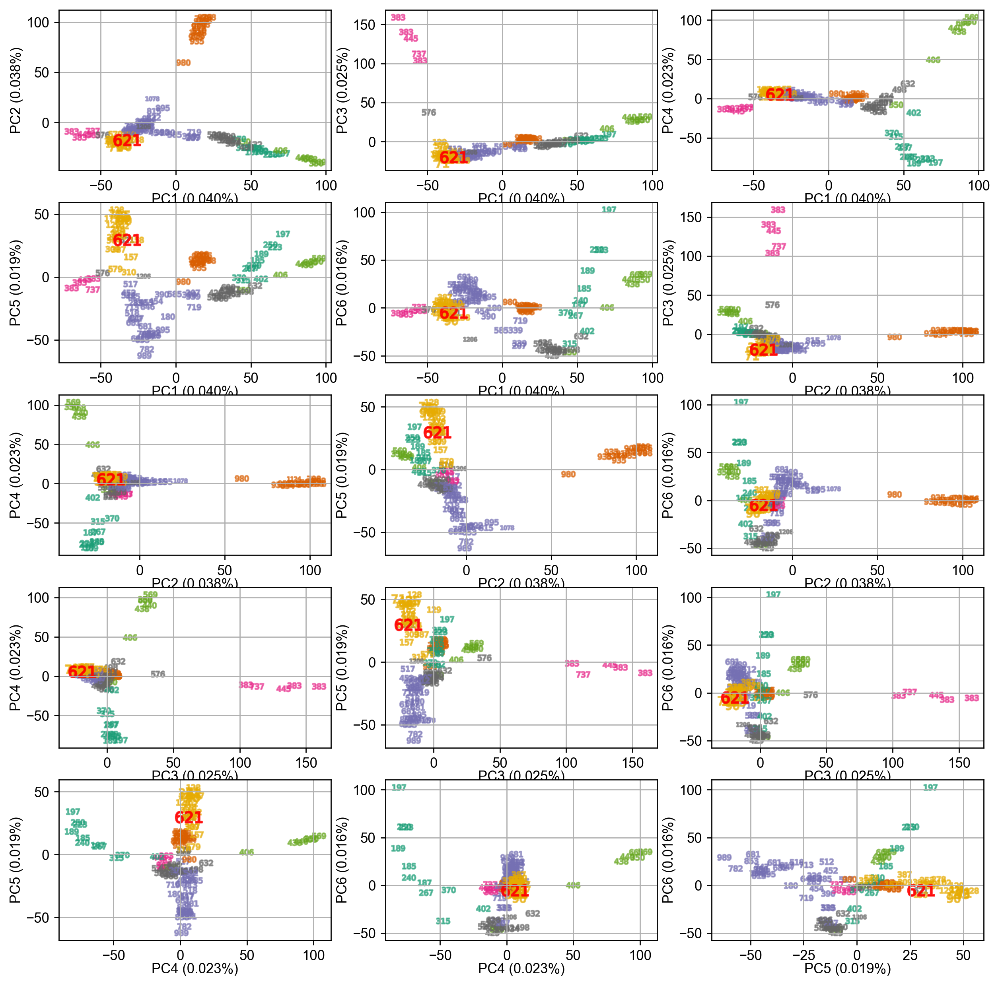

In [375]:
# from matplotlib import gridspec

deme = str(621)
idx = [str(poporder.loc[w==poporder['id']]['id'].values[0]) for w in wolves_graph.assned_node_idx].index(deme)

fig = plt.figure(dpi=250,figsize=(12,12))
plt.subplots_adjust(left=None, bottom=.1, right=None, top=None, wspace=None, hspace=.2)
for n, ticks in enumerate(list(it.combinations(range(6),2))):
    ax_00 = plt.subplot(5, 3, n + 1)
    for i in range(wolves_graph.genotypes.shape[0]):
        ax_00.scatter(pcacoord[i,ticks[0]],pcacoord[i,ticks[1]],s=100,marker='$'+str(poporder.loc[wolves_graph.assned_node_idx[i]==poporder['id']]['id'].values[0])+'$',c=cols[i],alpha=0.6)
    ax_00.set_xlabel('PC{:d} ({:.3f}%)'.format(ticks[0]+1,mod.explained_variance_ratio_[ticks[0]]),labelpad=0); ax_00.set_ylabel('PC{:d} ({:.3f}%)'.format(ticks[1]+1,mod.explained_variance_ratio_[ticks[1]]),labelpad=2); 
    ax_00.grid(); ax_00.scatter(pcacoord[idx,ticks[0]],pcacoord[idx,ticks[1]],s=400,marker='$'+deme+'$',c='r',alpha=0.8); 

In [406]:
# plt.hist(res.resid,15); 
# max_res_node = []; pval = []
# for k in np.where(res.resid<sp.stats.norm.ppf(0.001,loc=0,scale=np.std(res.resid)))[0]:
#     x = np.floor(np.sqrt(2*k+0.25)-0.5).astype('int')+1
#     y = int(k - 0.5*x*(x-1))
#     max_res_node.append(sorted((x,y)))
#     pval.append(sp.stats.norm.cdf(res.resid[k],loc=0,scale=np.std(res.resid)))

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
#         edge_alpha=1, edge_zorder=100, sample_pt_size=10, 
#         obs_node_size=7.5, sample_pt_color="black", 
#         cbar_font_size=10)
# v.draw_map(latlong=False); v.draw_samples(); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# obs_grid = v.grid[query_node_attributes(wolves_graph, "permuted_idx")[:wolves_graph.n_observed_nodes],:]
# for ij, j in enumerate(np.unique(np.array(max_res_node)[:,1])):
#     for i in np.where(np.array(max_res_node)[:,1]==j)[0]:
#         v.ax.plot(
#             [obs_grid[max_res_node[i][0], 0],obs_grid[max_res_node[i][1],0]],
#             [obs_grid[max_res_node[i][0], 1],obs_grid[max_res_node[i][1],1]],
#             color = 'grey', linewidth = 0.2, alpha=0.95, ls='-.'
#         )
#         v.ax.text(
#             np.mean([obs_grid[max_res_node[i][0], 0],obs_grid[max_res_node[i][1], 0]]),
#             np.mean([obs_grid[max_res_node[i][0], 1],obs_grid[max_res_node[i][1], 1]]),
#             str("{:.1e}".format(pval[i])),
#             horizontalalignment="left",
#             verticalalignment="center",
#             size=v.obs_node_textsize*0.6
#         )

In [334]:
os.chdir('/Users/vivaswatshastry/src/feems/feems/data/wolves/')
Q_k2 = np.loadtxt("wolvesadmix.2.Q")
Q_k3 = np.loadtxt("wolvesadmix.3.Q")
Q_k4 = np.loadtxt("wolvesadmix.4.Q")
Q_k5 = np.loadtxt("wolvesadmix.5.Q")
Q_k6 = np.loadtxt("wolvesadmix.6.Q")
Q_k7 = np.loadtxt("wolvesadmix.7.Q")
Q_k8 = np.loadtxt("wolvesadmix.8.Q")

#################### colors ####################
colors_k2 = ["#1b9e77", "#d95f02"] # x
colors_k3 = ["#1b9e77", "#d95f02", "#7570b3"] # x
colors_k4 = ["#7570b3", "#e7298a", "#d95f02", "#1b9e77"] # x
colors_k5 = ["#e7298a", "#66a61e", "#d95f02", "#1b9e77", "#7570b3"] # x 
colors_k6 = ["#1b9e77", "#e7298a", "#7570b3", "#e6ab02", "#d95f02", "#66a61e"] # x
colors_k7 = ["#e6ab02", "#a6761d", "#66a61e", "#7570b3", "#e7298a", "#1b9e77", "#d95f02"] # x 
colors_k8 = ["#1b9e77", "#e6ab02", "#d95f02", "#66a61e", "#666666", "#a6761d", "#7570b3", "#e7298a"] # x

In [333]:
def draw_admix_pie(admix_fracs, 
                   x, y, 
                   colors,
                   radius=.18, 
                   inset_width=.5,
                   inset_height=.5,
                   loc=10,
                   linewidth=.2,
                   edgecolor="black",
                   ax=None):
    """Draws a single admixture pie on a axis
    """
    xy = (x, y)
    ax_i = inset_axes(ax, 
                      width=inset_width, 
                      height=inset_height, 
                      loc=loc, 
                      bbox_to_anchor=(x, y),
                      bbox_transform=ax.transData, 
                      borderpad=0)
    wedges, t = ax_i.pie(admix_fracs, 
                         colors=colors, 
                         center=xy, 
                         radius=radius, 
                         wedgeprops={"linewidth": linewidth, 
                                     "edgecolor": edgecolor})

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: i

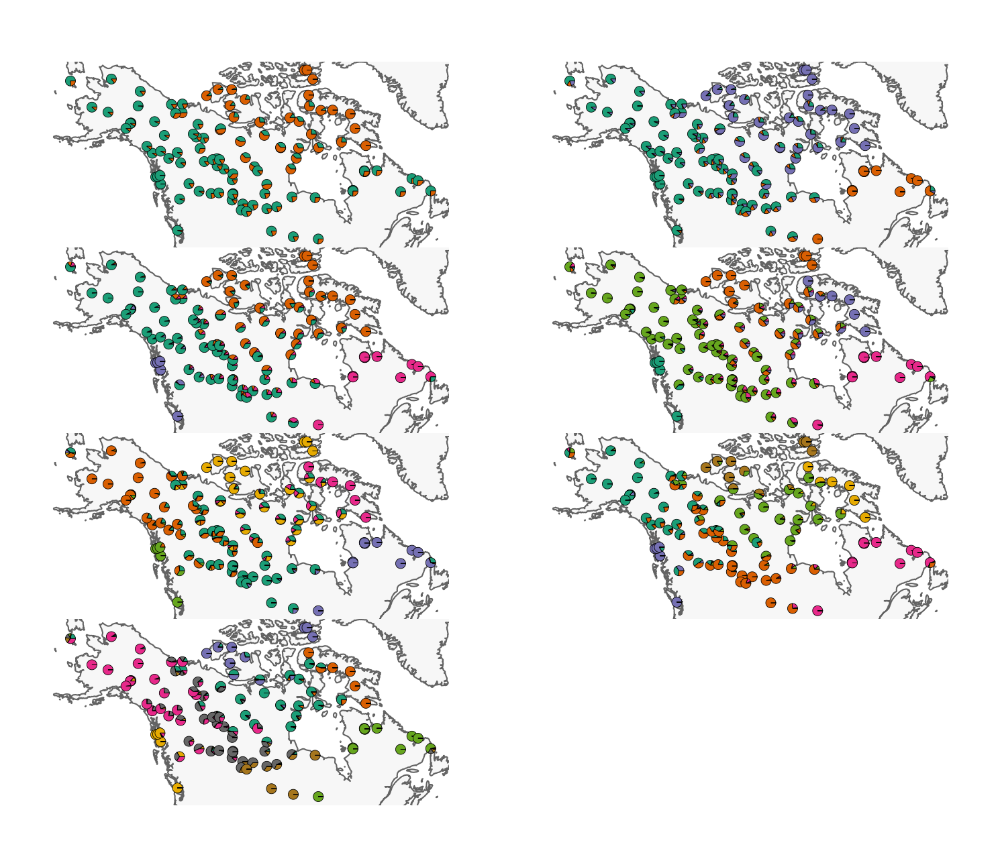

In [336]:
from matplotlib import gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
n, p = wolves_graph.genotypes.shape
radius = 0.125; title_pad = -10; title_loc = "left"
fig = plt.figure(dpi=300)
spec = gridspec.GridSpec(ncols=2, nrows=4, figure=fig, wspace=0.0, hspace=0.0)

#################### axis 00 ####################
ax_00 = fig.add_subplot(spec[0, 0], projection=projection)
# ax_00.set_title("K=2", loc=title_loc, pad=title_pad)
v = Viz(ax_00, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_00.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0.0)
for i in range(n):
    draw_admix_pie(Q_k2[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k2, 
                   radius=radius,
                   ax=ax_00)
    
#################### axis 01 ####################
ax_01 = fig.add_subplot(spec[0, 1], projection=projection)
# ax_01.set_title("K=3", loc=title_loc, pad=title_pad)
v = Viz(ax_01, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_01.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
for i in range(n):
    draw_admix_pie(Q_k3[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k3, 
                   radius=radius,
                   ax=ax_01)

#################### axis 10 ####################
ax_10 = fig.add_subplot(spec[1, 0], projection=projection)
# ax_10.set_title("K=4", loc=title_loc, pad=title_pad)
v = Viz(ax_10, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_10.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
for i in range(n):
    draw_admix_pie(Q_k4[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k4, 
                   radius=radius,
                   ax=ax_10)

#################### axis 11 ####################
ax_11 = fig.add_subplot(spec[1, 1], projection=projection)
# ax_11.set_title("K=5", loc=title_loc, pad=title_pad)
v = Viz(ax_11, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_11.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
for i in range(n):
    draw_admix_pie(Q_k5[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k5, 
                   radius=radius,
                   ax=ax_11)

#################### axis 20 ####################
ax_20 = fig.add_subplot(spec[2, 0], projection=projection)
# ax_20.set_title("K=6", loc=title_loc, pad=title_pad)
v = Viz(ax_20, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_20.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
for i in range(n):
    draw_admix_pie(Q_k6[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k6, 
                   radius=radius,
                   ax=ax_20)

#################### axis 21 ####################
ax_21 = fig.add_subplot(spec[2, 1], projection=projection)
# ax_21.set_title("K=7", loc=title_loc, pad=title_pad)
v = Viz(ax_21, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_21.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
for i in range(n):
    draw_admix_pie(Q_k7[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k7, 
                   radius=radius,
                   ax=ax_21)

#################### axis 30 ####################
ax_30 = fig.add_subplot(spec[3, 0], projection=projection)
# ax_30.set_title("K=8", loc=title_loc, pad=title_pad)
v = Viz(ax_30, wolves_graph, projection=projection)
v.draw_map(latlong=False)
ax_30.scatter(v.coord[:,0], v.coord[:,1], marker=".", s=0)
for i in range(n):
    draw_admix_pie(Q_k8[i, :], 
                   v.coord[i, 0], 
                   v.coord[i, 1], 
                   colors_k8, 
                   radius=radius,
                   ax=ax_30)

In [340]:
# v.ax.tricontourf([v.grid[x[0],0] for x in contour_df980['(source, dest.)']],[v.grid[x[0],1] for x in contour_df980['(source, dest.)']], contour_df980['scaled log-lik'], cmap='Greens', extend='max', alpha=0.7, levels=[-20,-10,-2,0]) 
# np.where(np.isnan(contour_df980['scaled log-lik']))
# contour_df402.loc[np.argmax(contour_df402['scaled log-lik'])+1]

(source, dest.)       (250, 37)
admix. prop.           0.088877
log-lik           -40878.225247
scaled log-lik              0.0
Name: 198, dtype: object

In [11]:
# contour_df980 = obj.calc_contour(destpid=980, search_area='all')

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
#         obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df980,levels=1,ll_thresh=-3)
# v.ax.plot(obs_grid[np.where(permuted_idx == 980)[0], 0], obs_grid[np.where(permuted_idx == 980)[0], 1], 'ro', markersize=10, alpha=0.5)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
#         obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_ll_contour(contour_df980,levels=[-5,-2,0])
# v.ax.plot(obs_grid[np.where(permuted_idx == 980)[0], 0], obs_grid[np.where(permuted_idx == 980)[0], 1], 'ro', markersize=10, alpha=0.5)

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

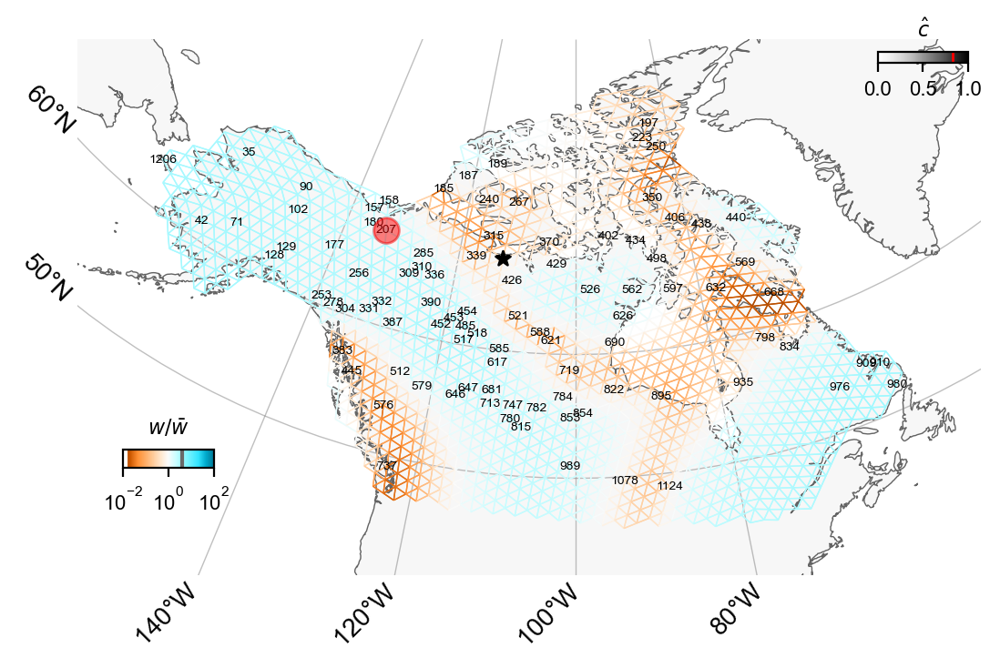

In [392]:
# contour_df207 = obj.calc_contour(destpid=207, search_area='all')
# contour_df207 = contour_df207.drop(np.where(np.isnan(contour_df207['scaled log-lik']))[0]+1)
# plt.hist(contour_df207['admix. prop.'],bins=20)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
#         obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df207,levels=[0,0.1,0.25,0.5,1])
# v.ax.plot(obs_grid[np.where(permuted_idx == 207)[0], 0], obs_grid[np.where(permuted_idx == 207)[0], 1], 'ro', markersize=10, alpha=0.5)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df207,levels=[-10,-5,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 207)[0], 0], obs_grid[np.where(permuted_idx == 207)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 207)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 207)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

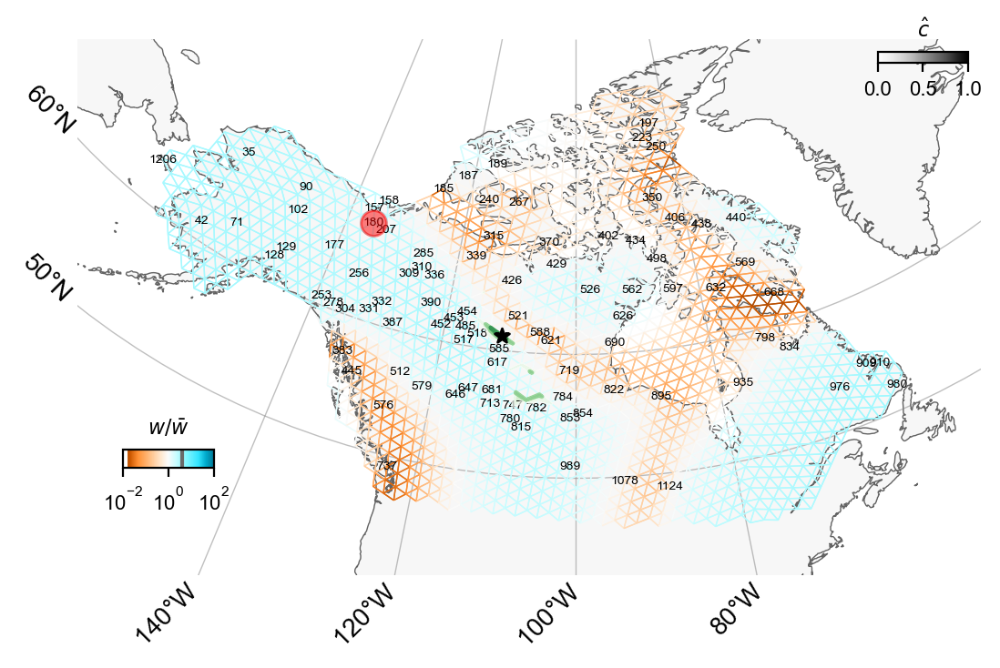

In [140]:
# contour_df180 = obj.calc_contour(destpid=180, search_area='all')
# contour_df180 = contour_df180.drop(np.where(np.isnan(contour_df180['scaled log-lik']))[0]+1)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df180,levels=[-10,-5,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 187)[0], 0], obs_grid[np.where(permuted_idx == 187)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 180)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 180)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

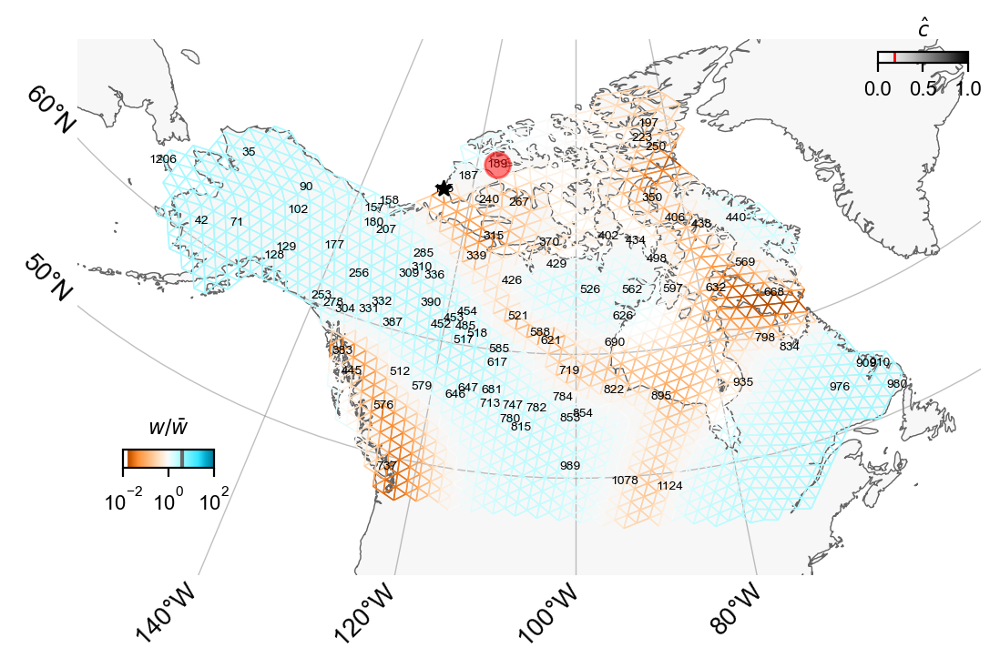

In [134]:
# contour_df189 = obj.calc_contour(destpid=189, search_area='all')

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df189,levels=[-20,-10,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 187)[0], 0], obs_grid[np.where(permuted_idx == 187)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 189)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 189)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

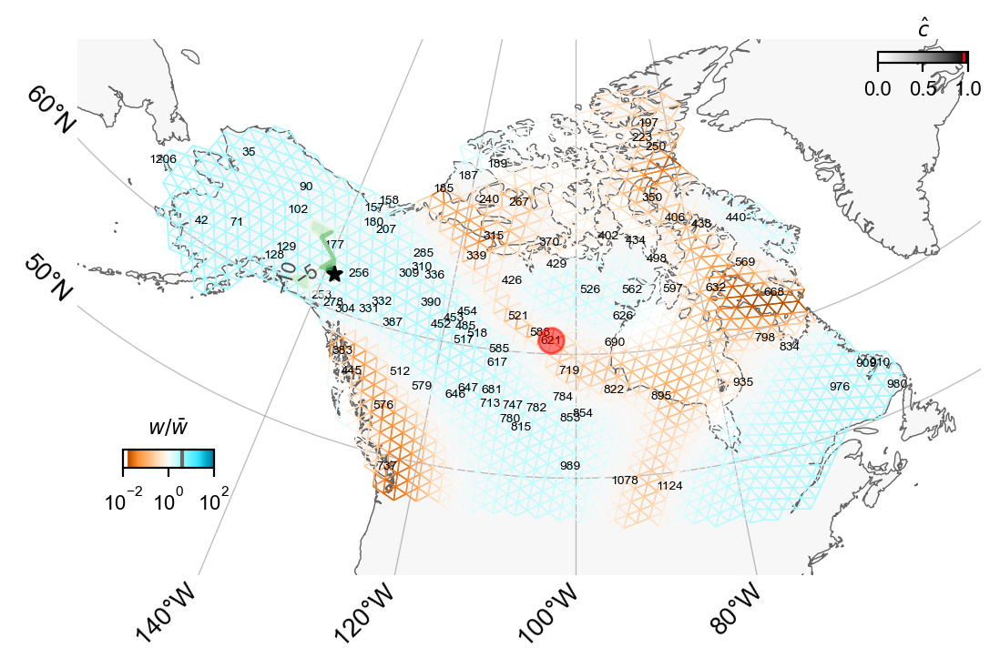

In [387]:
# contour_df621 = obj.calc_contour(destpid=621, search_area='range', opts=[[-115,-180],[40,80]])  

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df621,levels=[0,0.1,0.25,0.5,1])
# v.ax.plot(obs_grid[np.where(permuted_idx == 621)[0], 0], obs_grid[np.where(permuted_idx == 621)[0], 1], 'ro', markersize=10, alpha=0.5)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df621,levels=[-10,-5,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 621)[0], 0], obs_grid[np.where(permuted_idx == 621)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 621)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 621)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

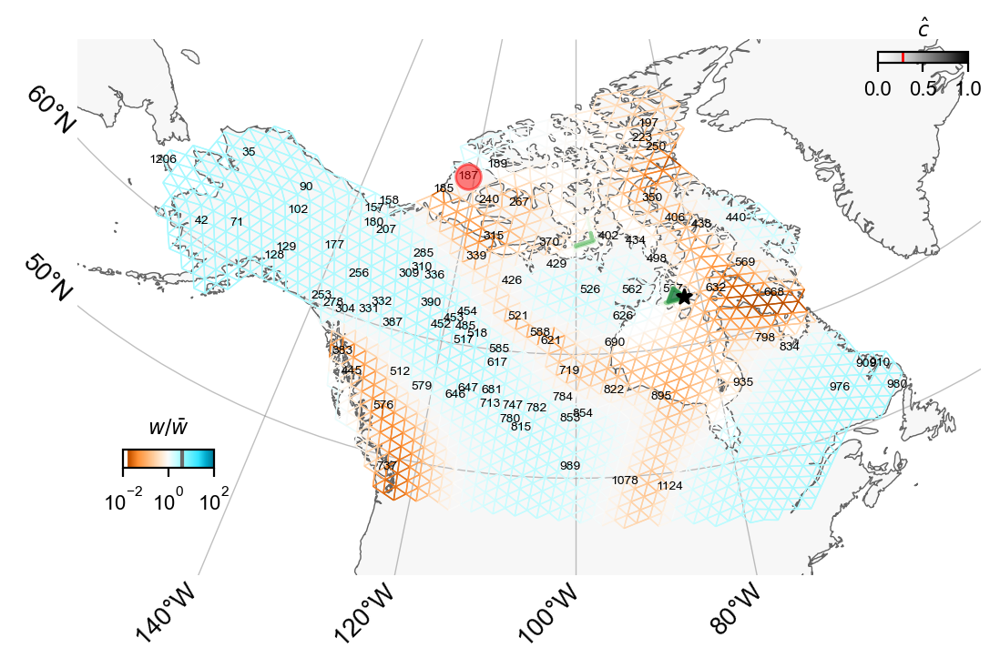

In [258]:
# contour_df187 = obj.calc_contour(destpid=187, search_area='all') 

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df187,levels=2)
# v.ax.plot(obs_grid[np.where(permuted_idx == 187)[0], 0], obs_grid[np.where(permuted_idx == 187)[0], 1], 'ro', markersize=10, alpha=0.5)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df187,levels=[-10,-5,-2,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 187)[0], 0], obs_grid[np.where(permuted_idx == 187)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 187)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 187)[0], 1][0]))

In [17]:
# contour_df402 = obj.calc_contour(destpid=402, search_area='all') 

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df402,levels=2)
# v.ax.plot(obs_grid[np.where(permuted_idx == 402)[0], 0], obs_grid[np.where(permuted_idx == 402)[0], 1], 'ro', markersize=10, alpha=0.5)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_ll_contour(contour_df402,levels=[-10,-5,-2,0])
# v.ax.plot(obs_grid[np.where(permuted_idx == 402)[0], 0], obs_grid[np.where(permuted_idx == 402)[0], 1], 'ro', markersize=10, alpha=0.5)

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

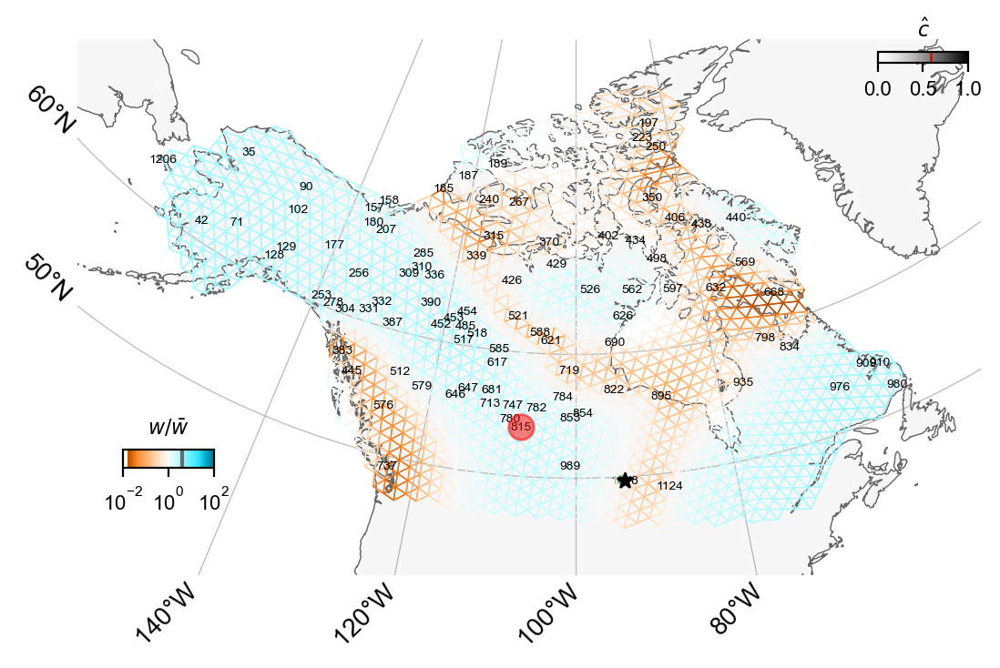

In [130]:
# contour_df815 = obj.calc_contour(destpid=815, search_area='all')
# contour_df815 = contour_df815.drop(np.where(np.isnan(contour_df815['scaled log-lik']))[0]+1)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df815,levels=3,ll_thresh=-40)
# v.ax.plot(obs_grid[np.where(permuted_idx == 815)[0], 0], obs_grid[np.where(permuted_idx == 815)[0], 1], 'ro', markersize=10, alpha=0.5)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_ll_contour(contour_df815,levels=[-20,-10,-2,0])
# v.ax.plot(obs_grid[np.where(permuted_idx == 815)[0], 0], obs_grid[np.where(permuted_idx == 815)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 815)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 815)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shap

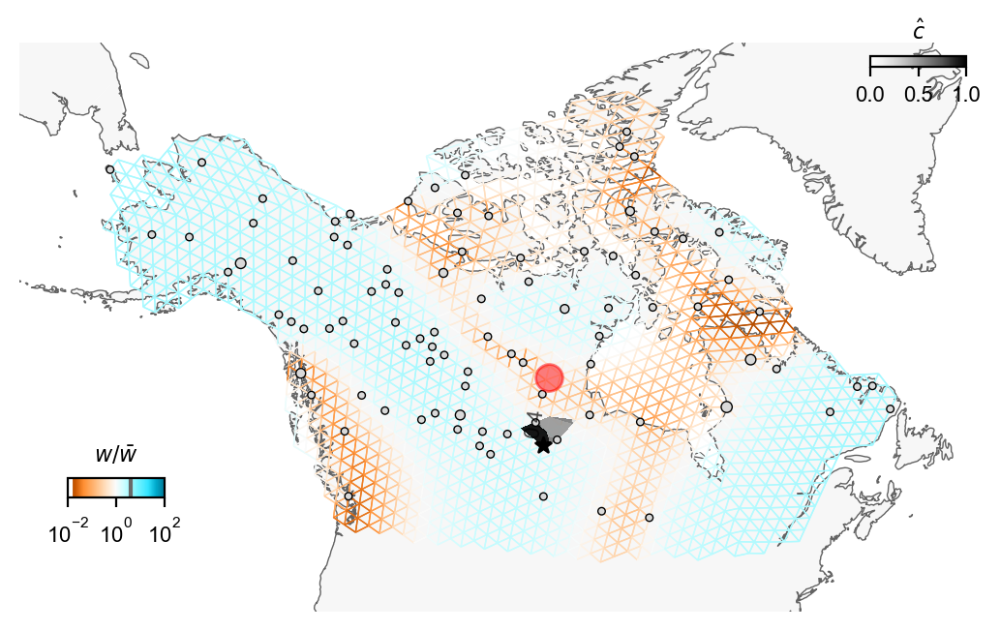

In [123]:
# contour_df747 = obj.calc_contour(destpid=747, search_area='all')
# contour_df747 = contour_df747.drop([620,650,683]) # np.where(np.isnan(contour_df747['scaled log-lik']))[0]+1

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
v.draw_c_contour(contour_df747,levels=1,ll_thresh=-60)
v.ax.plot(obs_grid[np.where(permuted_idx == 747)[0], 0], obs_grid[np.where(permuted_idx == 747)[0], 1], 'ro', markersize=10, alpha=0.5)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
# v.draw_ll_contour(contour_df747,levels=[-20,-10,-2,0])
# v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 747)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 747)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

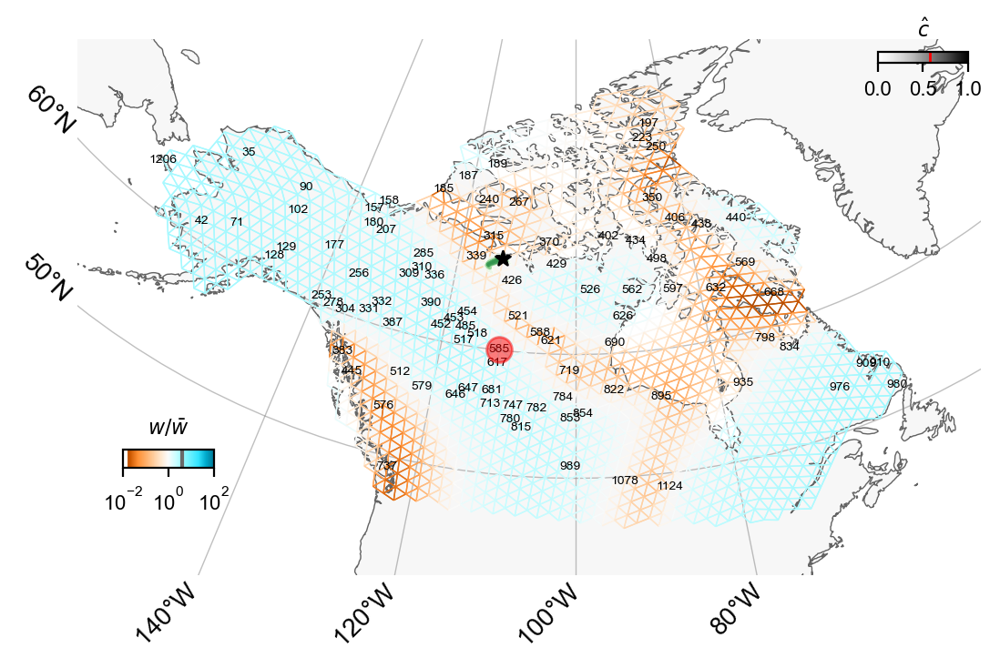

In [96]:
# contour_df585 = obj.calc_contour(destpid=585, search_area='all')

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df585,levels=[-20,-10,-5,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 585)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 585)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

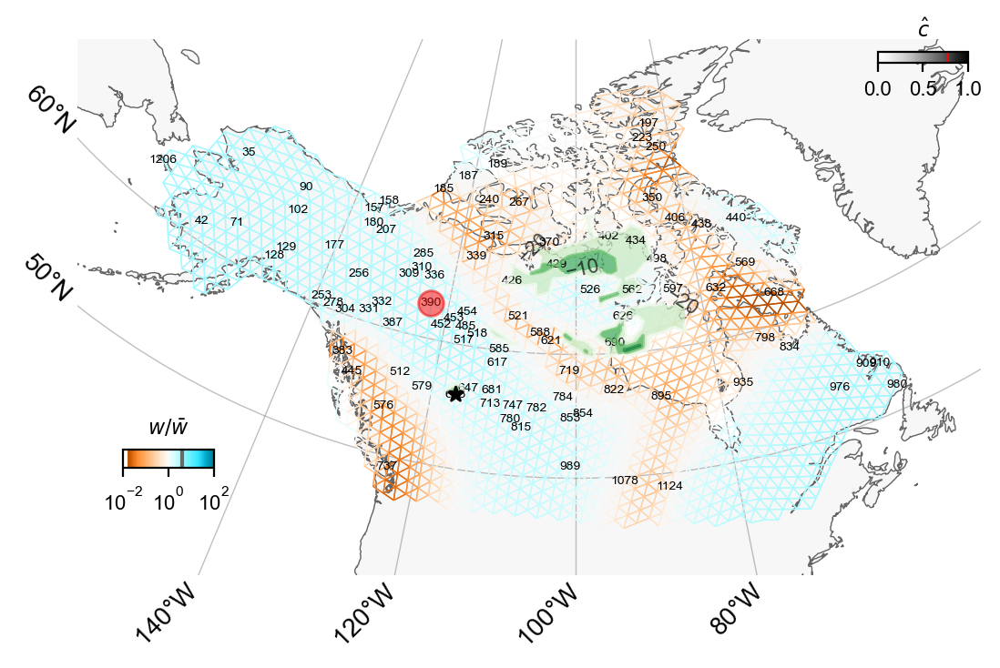

In [95]:
# contour_df390 = obj.calc_contour(destpid=390, search_area='all')
# contour_df390 = contour_df390.drop(295)

# fig = plt.figure(dpi=200)
# ax = fig.add_subplot(1, 1, 1, projection=projection)  
# v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
# v.draw_map(latlong=False); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
# v.draw_c_contour(contour_df390,levels=3,ll_thresh=-10)
# v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5)


fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df390,levels=[-20,-10,-5,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 390)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 390)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 390)[0], 1][0]))

/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/

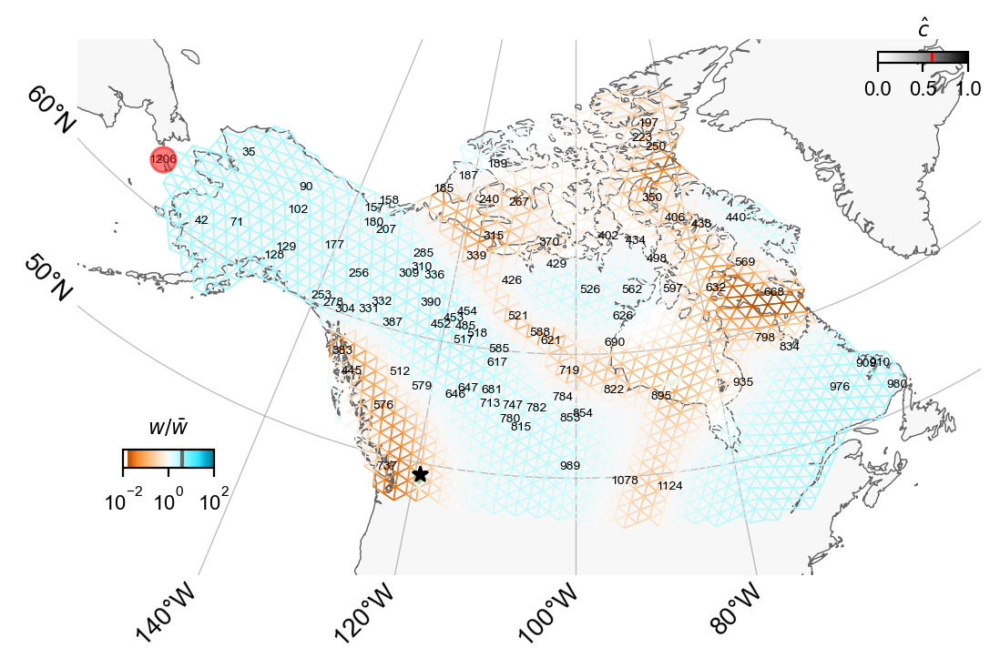

In [154]:
# contour_df1206 = obj.calc_contour(destpid=1206, search_area='all')
# contour_df1206 = contour_df1206.drop(np.where(np.isnan(contour_df1206['scaled log-lik']))[0]+1)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, edge_alpha=1, edge_zorder=100, sample_pt_size=10, obs_node_textsize=5,obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=8, cbar_width=0.5, cbar_height=0.1, cbar_font_size=8)
v.draw_map(latlong=[[50,60],[-140,-120,-100,-80]]); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=True); v.draw_edge_colorbar()
v.draw_ll_contour(contour_df1206,levels=[-10,-5,0])
v.ax.plot(obs_grid[np.where(permuted_idx == 1206)[0], 0], obs_grid[np.where(permuted_idx == 390)[0], 1], 'ro', markersize=10, alpha=0.5, transform=ccrs.EquidistantConic(central_longitude=obs_grid[np.where(permuted_idx == 1206)[0], 0][0], central_latitude=obs_grid[np.where(permuted_idx == 1206)[0], 1][0]))

In [23]:
# import networkx as nx
# sample_idx = nx.get_node_attributes(wolves_graph, "sample_idx")
# permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
# observed_permuted_idx = permuted_idx[: wolves_graph.n_observed_nodes]

# freqs = np.zeros_like(wolves_graph.frequencies)
# for i, node_id in enumerate(observed_permuted_idx):
#     s = sample_idx[node_id]

#     # compute mean at each node
#     freqs[i,:] = np.mean(wolves_graph.genotypes[s,:], axis=0)/2

# het = 2*freqs*(1-freqs)

# plt.plot(np.arange(1,wolves_graph.n_observed_nodes+1),het.mean(axis=1),'ko'); plt.axhline(het.mean(),color='red',linestyle='--'); plt.xlabel('deme ID'); plt.ylabel('average heterozygosity'); plt.grid()

0.001171062547608351

/var/folders/vc/r8504j4j0ds4cvn52fqczvzh0000gr/T/ipykernel_63362/765398906.py:15: RuntimeWarning: divide by zero encountered in log10
  ax_00.scatter(np.log10(x),


Text(0, 0.5, 'genetic distance')

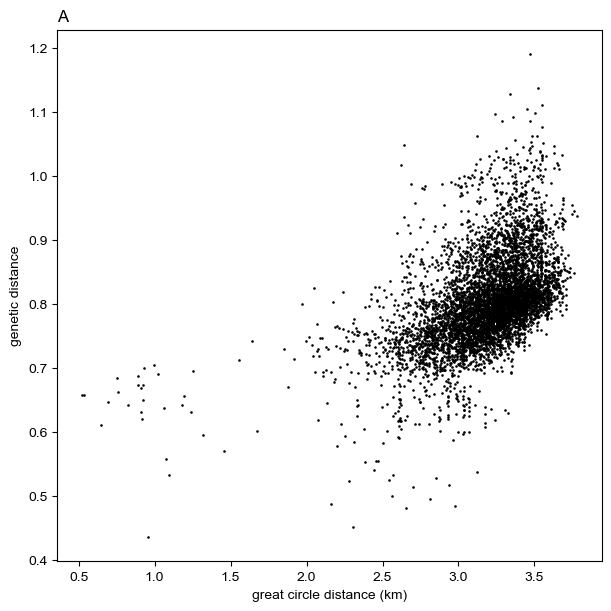

In [35]:
fig = plt.figure(constrained_layout=True, dpi=100, figsize=(6, 6))
D_geno = squareform(pdist(genotypes, metric="sqeuclidean")) / p
coord_rad = coord[:,::-1] * np.pi / 180.0
D_geo = haversine_distances(coord_rad) * 6371000/1000
tril_idx = np.tril_indices(n, k=-1)
x = D_geo[tril_idx]
y = D_geno[tril_idx]
X = sm.add_constant(x)
mod = sm.OLS(y, X)
res = mod.fit()
muhat, betahat = res.params

ax_00 = fig.add_subplot(1,1,1)
ax_00.set_title("A", loc='left')
ax_00.scatter(x, 
              y, 
              marker=".", 
              alpha=1, 
              zorder=0, 
              color="black",
              s=3)

x_ = np.linspace(np.min(x), np.max(x), 20)
ax_00.plot(x_, muhat + betahat * x_, zorder=2, color="orange", linestyle='--', linewidth=1)
ax_00.text(3500, .6, "R²={:.4f}".format(res.rsquared))
ax_00.set_xlabel("great circle distance (km)")
ax_00.set_ylabel("genetic distance")

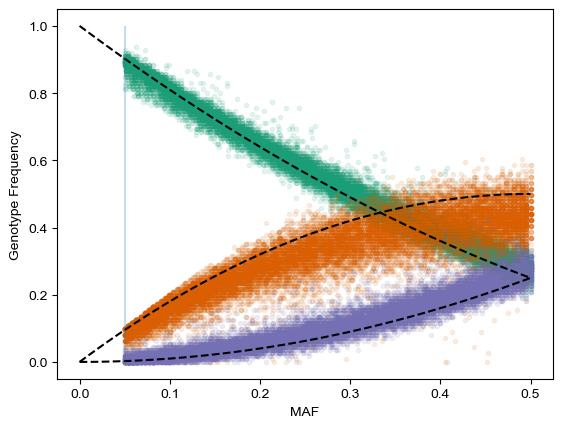

In [21]:
Y = 2 - genotypes
n, p = Y.shape

f = np.nansum(Y, axis=0) / (2.0*n)
f_aa = np.nansum(Y==0, axis=0) / n
f_Aa = np.nansum(Y==1, axis=0) / n
f_AA = np.nansum(Y==2, axis=0) / n

x = np.linspace(0, .5)
plt.scatter(f, f_aa, alpha=.1, marker=".", color="#1b9e77", zorder=0)
plt.plot(x, (1-x)**2, "--", color="black", zorder=1) 
plt.scatter(f, f_Aa, alpha=.1, marker=".", color="#d95f02", zorder=0)
plt.plot(x, 2*x*(1-x), "--", color="black", zorder=1) 
plt.scatter(f, f_AA, alpha=.1, marker=".", color="#7570b3", zorder=0)
plt.plot(x, x**2, "--", color="black", zorder=1) 
plt.xlabel("MAF");
plt.ylabel("Genotype Frequency");
plt.vlines(ymin=0, ymax=1, x=.05, linestyles="-", alpha=.25)

In [218]:
# permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
# obs_perm_ids = permuted_idx[: wolves_graph.n_observed_nodes]

# # code for mapping nodes back to populations (since multiple pops can be assigned to the same nodes)
# node_to_pop = pd.DataFrame(index = np.arange(wolves_graph.n_observed_nodes), columns = ['nodes', 'pops'])
# node_to_pop['nodes'] = obs_perm_ids
# 
# max_res_nodes = [(73, 34),(93, 69),(62, 54),(15, 31),(92,78)]
# list(map(tuple,node_to_pop['nodes'][np.ravel(max_res_nodes)].values.reshape(5,2)))
# node_pos == grid, sample_pos == coord
# wolves_graph.fit(lamb=2.,optimize_q='n-dim',lamb_q=1.,alpha_q=1.)
# wolves_graph.fit(lamb=3.,optimize_q='n-dim',lamb_q=1.,alpha_q=0.1,option='onlyc',long_range_edges=[(73, 34),(93, 69),(62, 54),(15, 31),(92,78)])

(0.8870588235294118, 0.8870588235294118, 0.8870588235294118, 1.0)

/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:146: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  self.idx = nx.adjacency_matrix(self.sp_graph).nonzero()
/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:333: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  idx = list(np.column_stack(idx))
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/viv

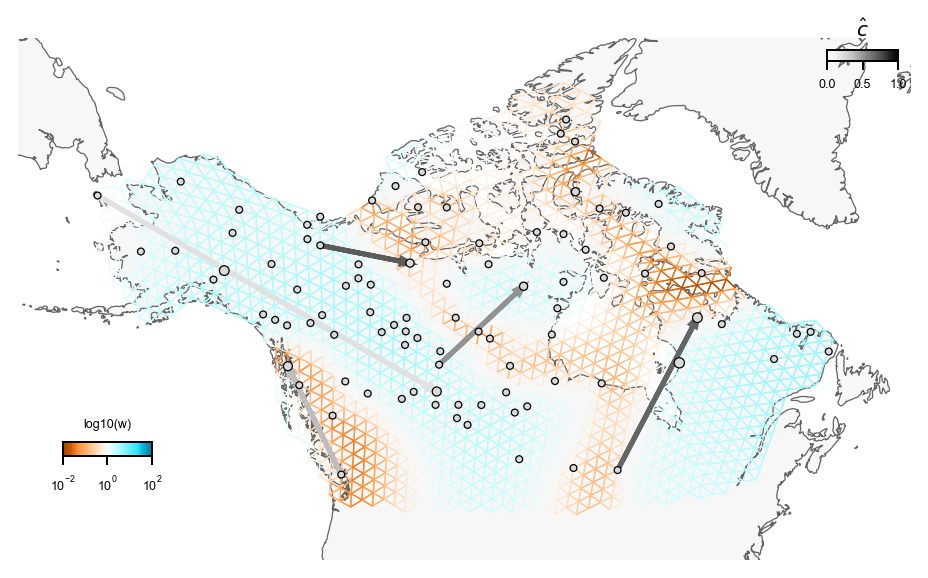

In [223]:
fig = plt.figure(dpi=180)
# wolves_graph.fit(lamb=2.,optimize_q='n-dim',lamb_q=1.,alpha_q=1.)
# wolves_graph.fit(lamb=2.,optimize_q='n-dim',lamb_q=1.,alpha_q=.1,option='onlyc',long_range_edges=[(73, 34),(93, 69),(62, 54),(15, 31),(92,78)])
projection = ccrs.EquidistantConic(central_longitude=-108.842926, central_latitude=66.037547) 
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", cbar_ticklabelsize=5,
        cbar_font_size=5, cbar_width='10%',cbar_height='2.5%')
v.draw_map(); v.draw_edges(use_weights=True); v.draw_obs_nodes(use_ids=False); v.draw_edge_colorbar()
for ie, e in enumerate([(737, 383), (1206, 681), (617, 526), (207, 339), (1124, 798)]):
        v.draw_arrow([e],wolves_graph.c[ie],lw=2,hw=50000,hl=80000)
v.draw_c_colorbar()

Now we can visualize the weighted graph:

constant-w/variance fit, converged in 132 iterations, train_loss=2795677.652
lambda=3.000, alpha=0.8354, converged in 64 iterations, train_loss=2751561.831


/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:146: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  self.idx = nx.adjacency_matrix(self.sp_graph).nonzero()
/Users/vivaswatshastry/src/feems/docs/notebooks/../../feems/viz.py:331: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  idx = nx.adjacency_matrix(sp_graph).nonzero()
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/vivaswatshastry/mambaforge/envs/feems/lib/python3.10/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffe

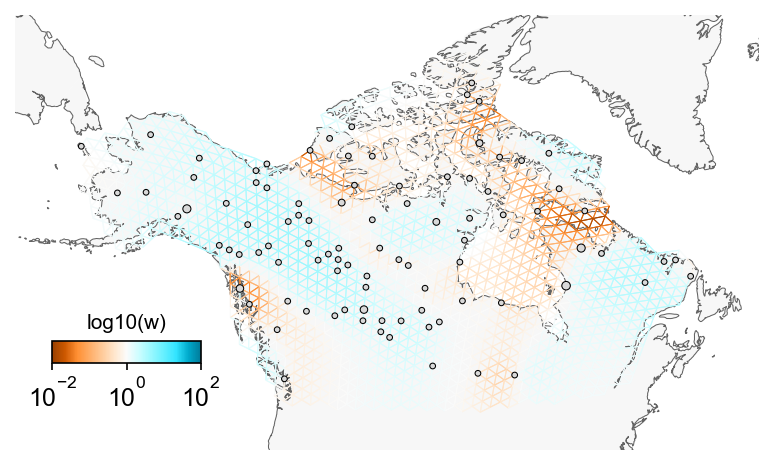

In [15]:
wolves_graph.fit(lamb=3., optimize_q='n-dim')
fig = plt.figure(dpi=150)
ax = fig.add_subplot(1, 1, 1, projection=projection)  
v = Viz(ax, wolves_graph, projection=projection, edge_width=.5, 
        edge_alpha=1, edge_zorder=100, sample_pt_size=20, 
        obs_node_size=7.5, sample_pt_color="black", 
        cbar_font_size=10)
v.draw_map()
v.draw_edges(use_weights=True)
v.draw_obs_nodes(use_ids=False) 
v.draw_edge_colorbar()

## Implementing a bootstrapping procedure to compute standard errors on fitted vs genetic distances

I will be sampling inds with replacement from each population (keeping the pop size constant). The source of variation is the sampling of inds from a fixed true pop size in each deme. 

In [117]:
wolves_graph.n_samples_per_obs_node_permuted[86:]

array([1, 5, 1, 1, 1, 1, 1, 1])

In [132]:
# nreps = 10
# rng = np.random.default_rng(2022); ss = rng.bit_generator._seed_seq; child_states = ss.spawn(nreps)
# fit_dist = np.zeros((wolves_graph.n_observed_nodes*(wolves_graph.n_observed_nodes-1)//2,nreps+1)); emp_dist = np.zeros_like(fit_dist)
## first column contains the results from the whole data set (not bootstrap replicates)
# obj = Joint_Objective(wolves_graph)
# fit_cov, _, emp_cov = comp_mats(obj)
# fit_dist[:,0] = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
# emp_dist[:,0] = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]

# def bootfun(seed,nsamps):
#     rng = np.random.default_rng(seed)
#     bootgenotypes = deepcopy(genotypes)
#     ctr = 0
#     for deme in range(len(nsamps)):
#         bootgenotypes[ctr:(ctr+nsamps[deme]),:] = genotypes[rng.choice(range(ctr,(ctr+nsamps[deme])),nsamps[deme]),:]
#         ctr += nsamps[deme]
#     temp_graph = Joint_SpatialGraph(bootgenotypes, coord, grid, edges)
#     temp_graph.fit(lamb=1., optimize_q='n-dim', lamb_q=1., alpha_q=1.0)
#     obj = Joint_Objective(temp_graph)
#     fit_cov, _, emp_cov = comp_mats(obj)
#     fit_dist = cov_to_dist(fit_cov)[np.tril_indices(len(nsamps), k=-1)]
#     emp_dist = cov_to_dist(emp_cov)[np.tril_indices(len(nsamps), k=-1)]
#     return [fit_dist, emp_dist]

# dists = Parallel(n_jobs=-1)(delayed(bootfun)(random_state,nsamps=wolves_graph.n_samples_per_obs_node_permuted) for random_state in child_states)

for n in range(1,nreps+1):
    fit_dist[:,n] = dists[n-1][0]; emp_dist[:,n] = dists[n-1][1]

# for n in range(1,nreps+1):
#     bootgenotypes = deepcopy(genotypes)
#     ctr = 0
#     for deme in range(wolves_graph.n_observed_nodes):
#         bootgenotypes[ctr:(ctr+wolves_graph.n_samples_per_obs_node_permuted[deme]),:100] = genotypes[rng.choice(range(ctr,(ctr+wolves_graph.n_samples_per_obs_node_permuted[deme])),wolves_graph.n_samples_per_obs_node_permuted[deme]),:100]
#         ctr += wolves_graph.n_samples_per_obs_node_permuted[deme]
#     wolves_graph = Joint_SpatialGraph(bootgenotypes, coord, grid, edges)
#     wolves_graph.fit(lamb=1., optimize_q='n-dim', lamb_q=1., alpha_q=1.0)
#     obj = Joint_Objective(wolves_graph)
#     fit_cov, _, emp_cov = comp_mats(obj)
#     fit_dist[:,n] = cov_to_dist(fit_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]
#     emp_dist[:,n] = cov_to_dist(emp_cov)[np.tril_indices(wolves_graph.n_observed_nodes, k=-1)]

In [137]:
# plotting the result, by first drawing the regression line using the whole data set
# X = sm.add_constant(fit_dist[:,0])
# mod = sm.OLS(emp_dist[:,0], X)
# res = mod.fit()
# muhat, betahat = res.params
# computing the standard errors from before
# se_fit = np.zeros(fit_dist.shape[0]); se_emp = np.zeros_like(se_fit)
# for i in range(fit_dist.shape[0]):
#     se_fit[i] = np.sqrt(np.sum((fit_dist[i,:]-np.mean(fit_dist[i,:]))**2)/(nreps-1))
#     se_emp[i] = np.sqrt(np.sum((emp_dist[i,:]-np.mean(emp_dist[i,:]))**2)/(nreps-1))
# finding the largest outliers, taking into account the SE might overlap with best-fit line
max_idx = np.argpartition(res.resid, 100)[:100]
max_idx = max_idx[np.argsort(res.resid[max_idx])]
new_max_idx = []
for i in max_idx:
    if ((fit_dist[i,0]-se_fit[i])>(emp_dist[i,0]-muhat)/betahat) & ((betahat*fit_dist[i,0]+muhat) > (emp_dist[i,0]+se_emp[i])):
        new_max_idx.append(i)
# plotting the figure
# fig = plt.figure(dpi=80)
# ax = fig.add_subplot()
# ax.scatter(fit_dist[:,0], emp_dist[:,0], marker=".", alpha=0.75, zorder=0, color="grey", s=6)
# ax.errorbar(fit_dist[:,0],emp_dist[:,0],xerr=se_fit[:],yerr=se_emp[:], ecolor='grey', fmt='none',elinewidth=2,alpha=0.4)
# ax.scatter(fit_dist[new_max_idx,0], emp_dist[new_max_idx,0], marker=".", alpha=0.75, zorder=0, color="k", s=10)
# ax.errorbar(fit_dist[new_max_idx,0],emp_dist[new_max_idx,0],xerr=se_fit[new_max_idx],yerr=se_emp[new_max_idx], ecolor='k', fmt='none',elinewidth=2,alpha=0.6)
# x_ = np.linspace(np.min(fit_dist), np.max(fit_dist), 20)
# ax.plot(x_, muhat + betahat * x_, zorder=2, color="orange", linestyle='--', linewidth=1)
# ax.text(0.8, 0.05, "R²={:.3f}".format(res.rsquared), transform=ax.transAxes); plt.xlim((0,9)); plt.ylim((0,9))
# ax.set_ylabel("genetic distance")
# ax.set_xlabel("fitted distance")

In [38]:
# only look for nodes that are representative of sampled populations...
permuted_idx = query_node_attributes(wolves_graph, "permuted_idx")
obs_perm_ids = permuted_idx[: wolves_graph.n_observed_nodes]
obs_grid = grid[obs_perm_ids, :]

In [35]:
## code for mapping nodes back to populations (since multiple pops can be assigned to the same nodes)
node_to_pop = pd.DataFrame(index = np.arange(wolves_graph.n_observed_nodes), columns = ['nodes', 'pops'])
node_to_pop['nodes'] = obs_perm_ids
node_to_pop['pops'] = [query_node_attributes(wolves_graph,"sample_idx")[x] for x in obs_perm_ids]

In [36]:
node_to_pop

,nodes,pops
0,35,[105]
1,42,[106]
2,71,[108]
3,90,[107]
4,102,[104]
...,...,...
89,980,[39]
90,989,[52]
91,1078,[0]
92,1124,[1]
